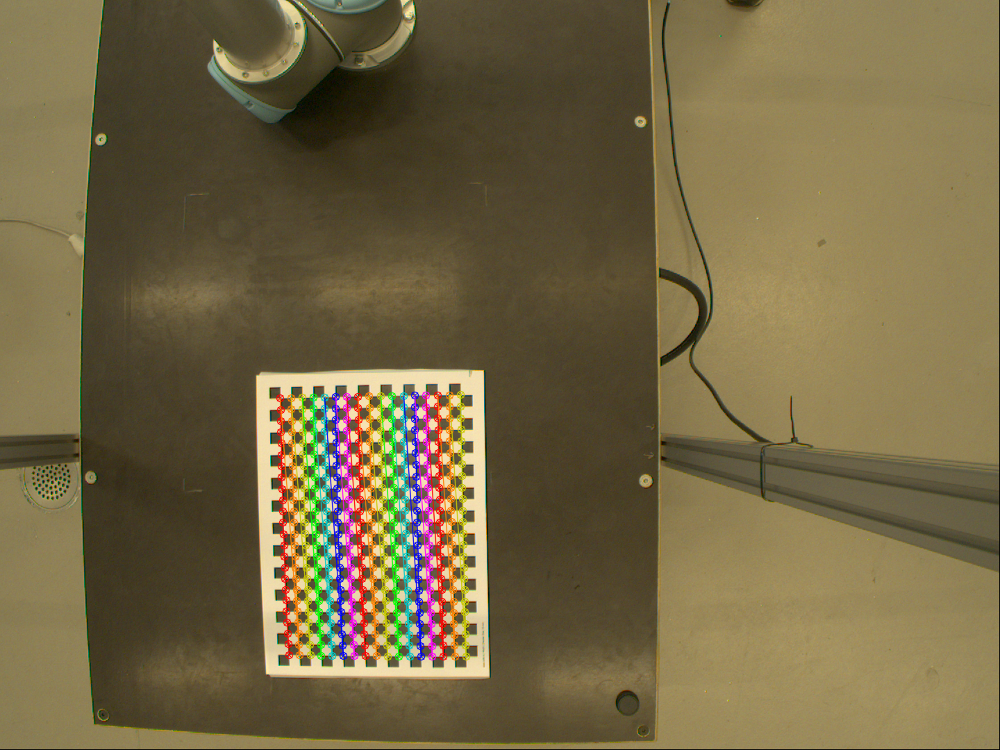

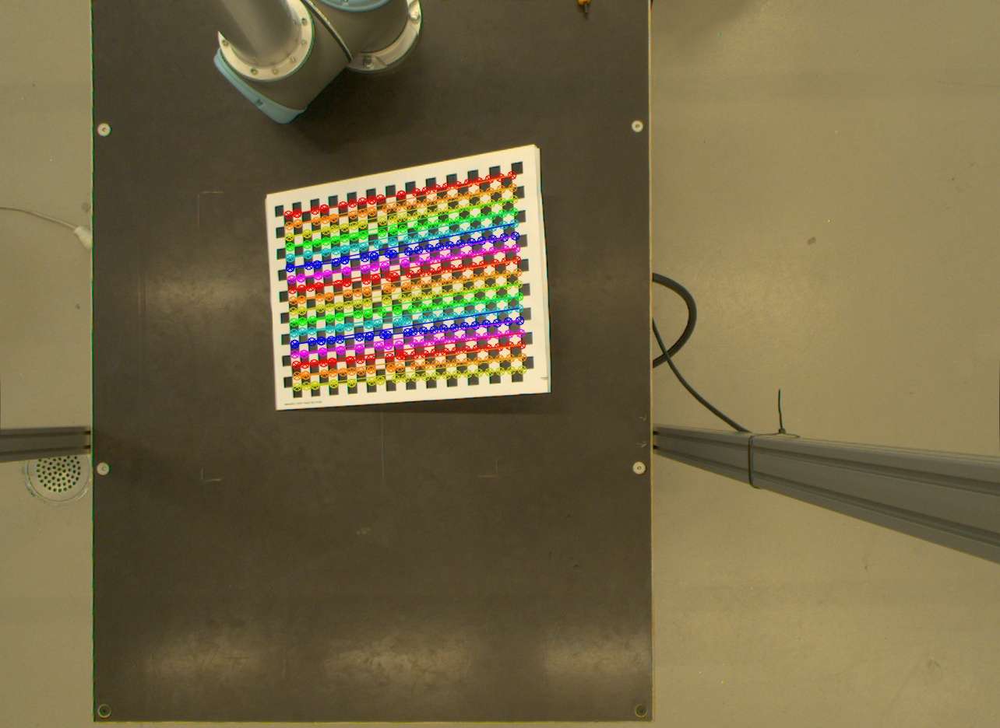

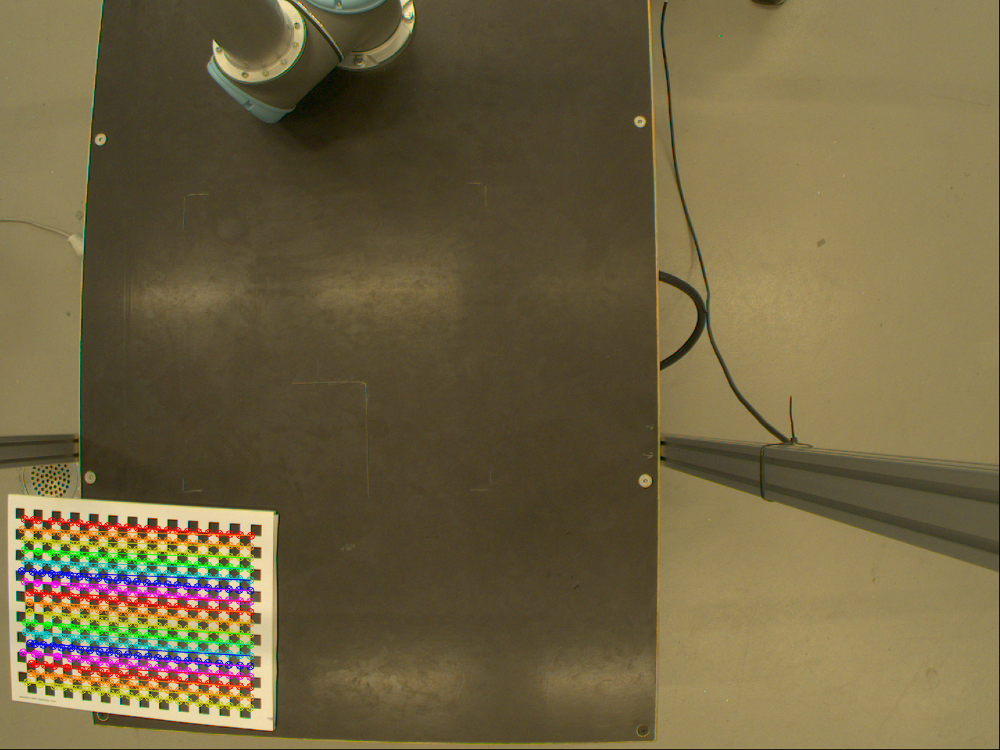

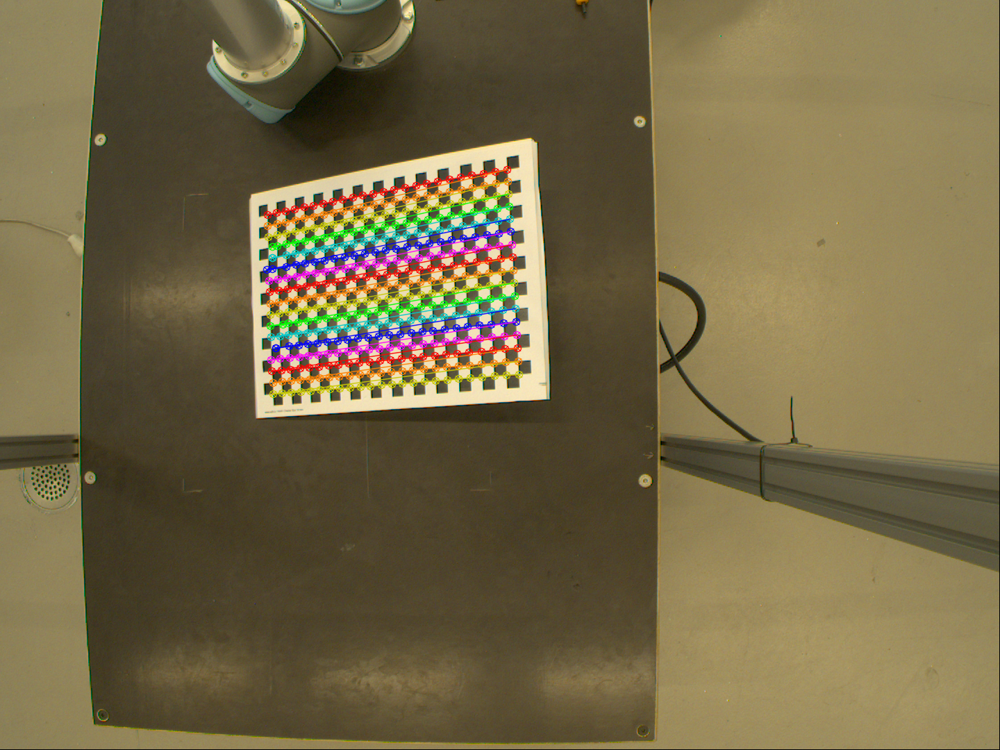

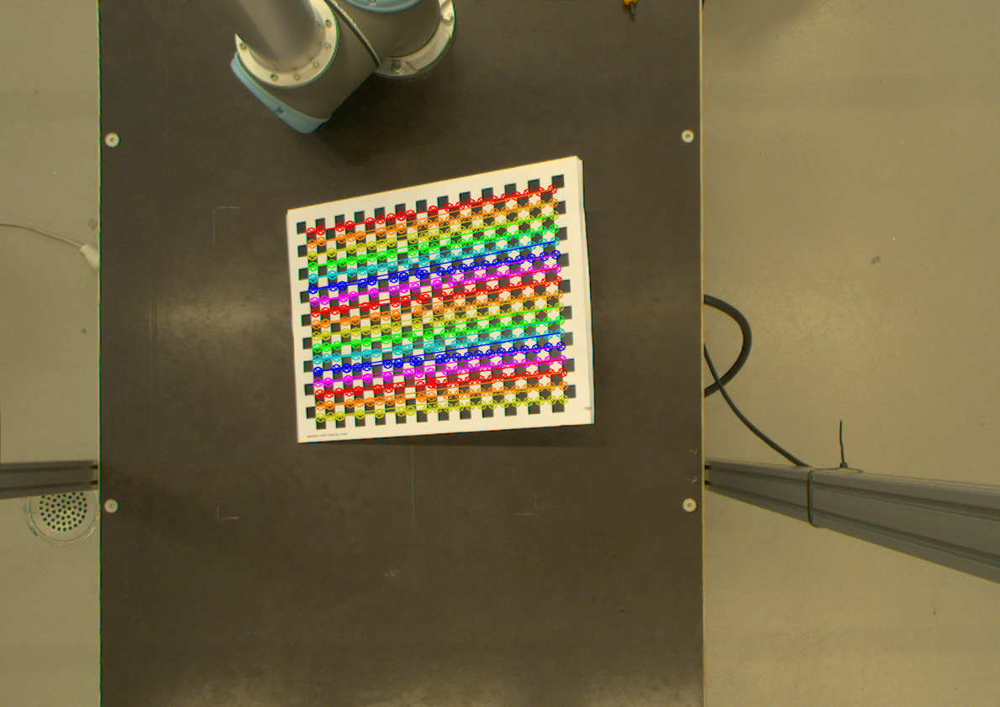

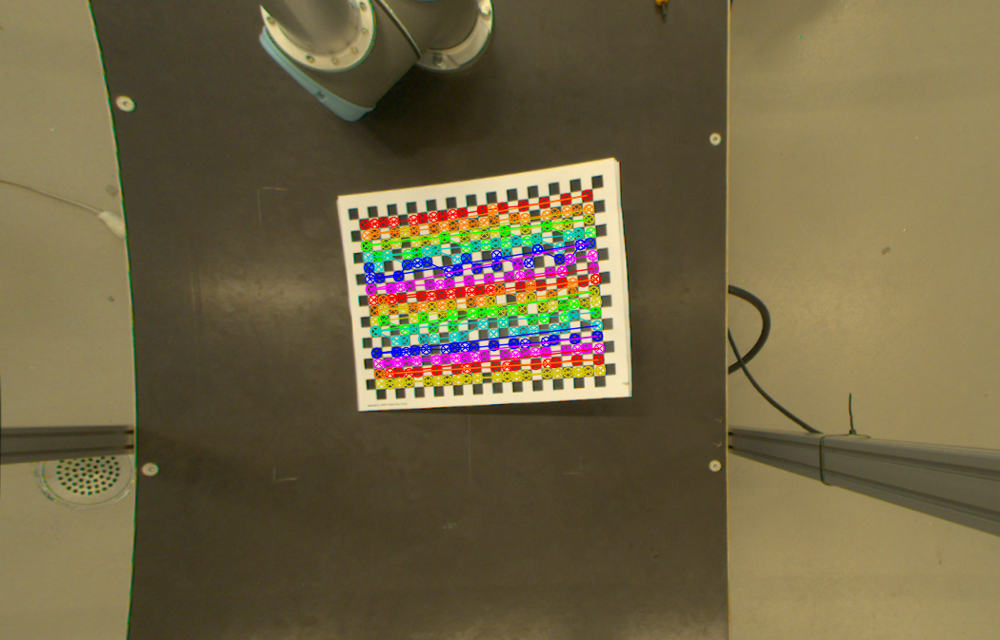

In [10]:
import numpy as np
import cv2 as cv
import glob
from google.colab.patches import cv2_imshow


# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)


# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
#Here I created the object points considering the size of the chess board as 24X17
objp = np.zeros((24 * 17, 3), np.float32)
objp[:,:2] = np.mgrid[0:24,0:17].T.reshape(-1,2)

size_of_chessboard_squares_mm = 20
objp = objp * size_of_chessboard_squares_mm


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.


images = glob.glob('*.png')

for image in images:

#OpenCV can only deal with grayscale images, so I am converting the image to greyscale

    img = cv.imread(image)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find the chess board corners
    CornerOrNot, corners = cv.findChessboardCorners(gray, (24,17), None)

    # If found, add object points, image points
    if CornerOrNot == True:

        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)

        # Draw and display the corners
        cv.drawChessboardCorners(img, (24,17), corners2, CornerOrNot)
        cv2_imshow(img)
        cv.waitKey(1000)


cv.destroyAllWindows()


#Image calibration using the calibrateCamera function given in OpenCV documentation

ret, cameraMatrix, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, (1440,1080), None, None)


############## UNDISTORTION #####################################################

for image in images:

  img = cv.imread(image)
  h,  w = img.shape[:2]
  newCameraMatrix, roi = cv.getOptimalNewCameraMatrix(cameraMatrix, dist, (w,h), 1, (w,h))



  # Undistort, this uses the function cv.undistort()
  dst = cv.undistort(img, cameraMatrix, dist, None, newCameraMatrix)

  # crop the image
  x, y, w, h = roi
  dst = dst[y:y+h, x:x+w]
  cv.imwrite(image + '_Newresult.png', dst)